In [1]:
from datasets import get_dataset
from datasets.ucla_protest import ProtestDataset
import argparse
import yaml
import os

def get_config(config_pt):
    """
    Load a YAML configuration file and return its content as a Python dictionary.
    """
    with open(config_pt, 'r') as stream:
        return yaml.safe_load(stream)

config = get_config('./configs/ucla_gan256.yaml')
train_set = ProtestDataset(
                txt_file=os.path.join(config["root_dir"], "annot_train.txt"),
                img_dir=os.path.join(config["root_dir"], "img", "train"),
                transform=None,
            )


protest_indices = []
for i in range(30000):
    if train_set[i]['label'] == 1:
        protest_indices.append(i)


[26816, 4837, 9110, 16427, 17309, 23366, 5752, 8515, 23151, 28183, 24280, 17421, 10660, 10756]


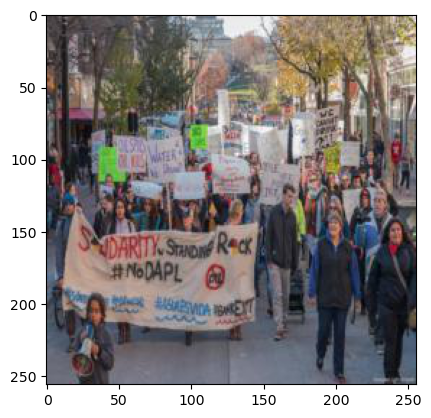

In [2]:
import random
import matplotlib.pyplot as plt
# Number of samples to display from each directory
num_samples = 14

plt.imshow(train_set[protest_indices[11]]['image'])

sampled_indices = random.sample(protest_indices, num_samples)
print(sampled_indices)

/tmp/ipykernel_3093168/391804036.py:40: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=1)


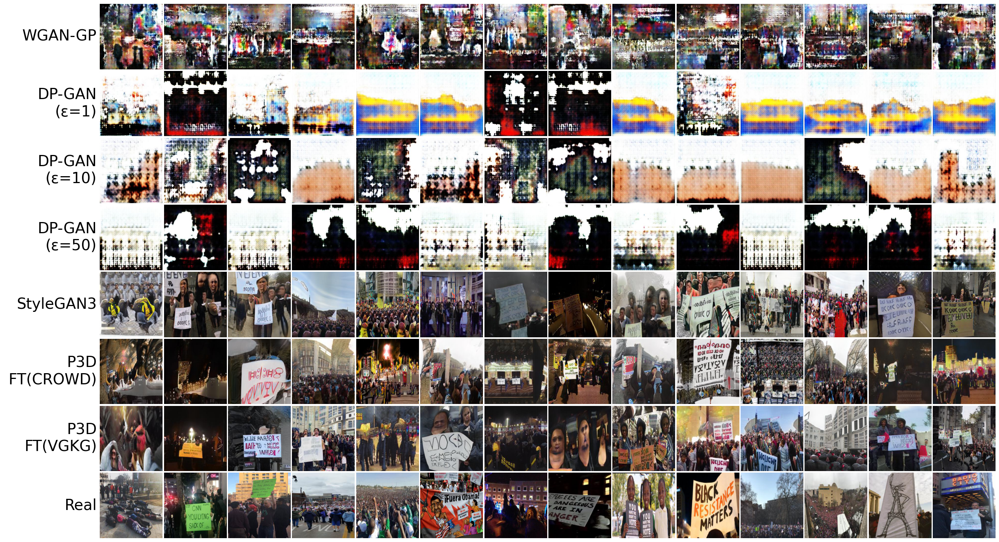

In [3]:
import os

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Paths to image directories
image_dirs = [
    '/u/amo-d0/grad/cgar/Projects/dp_protest/ckpts/UCLA WGANGP (full conditional)/train_set',
    '/u/amo-d0/grad/cgar/Projects/dp_protest/ckpts/UCLA DPGAN R2 eps 1 (full conditional)/train_set',
    '/u/amo-d0/grad/cgar/Projects/dp_protest/ckpts/UCLA DPGAN R2 (full conditional)/train_set',
    '/u/amo-d0/grad/cgar/Projects/dp_protest/ckpts/UCLA DPGAN R2 eps 50 (full conditional)/train_set',
    '/scratch/UCLA-protest-training-eval/img/train_base',
    '/scratch/UCLA-protest-training-eval/img/train_cwdcnt',
    '/scratch/UCLA-protest-training-eval/img/train_vgkg',
    '/scratch/UCLA-protest256/img/train'
]

names = ['WGAN-GP', 'DP-GAN\n(ε=1)','DP-GAN\n(ε=10)','DP-GAN\n(ε=50)', 'StyleGAN3', 'P3D\n FT(CROWD)','P3D\nFT(VGKG)','Real']


'DP-GAN	(ε=1)'
# Create a figure and axis
fig, axs = plt.subplots(8,num_samples, figsize=(30, 18),gridspec_kw = {'wspace':0.025, 'hspace':0.025})

# Iterate over each directory
for i, dir_path in enumerate(image_dirs):
    # Get a list of image file names in the directory
    image_files = sorted(os.listdir(dir_path))
    # Select random indices
    # Iterate over the selected random indices
    for j, idx in enumerate(sampled_indices):
        # Load and plot the image
        img_path = os.path.join(dir_path, image_files[idx])
        img = mpimg.imread(img_path)
        axs[i, j].imshow(img,aspect='auto')
        axs[i, j].axis('off')
    # Add a title above each row
    axs[i, 0].annotate(names[i], (0, 0.5), (-0.05, 0.5), xycoords='axes fraction', va='center', ha='right', fontsize=28)
    
plt.tight_layout(pad=1)
plt.savefig('main_plot.pdf', format='pdf', bbox_inches='tight')
plt.show()

IndexError: index 7 is out of bounds for axis 1 with size 7

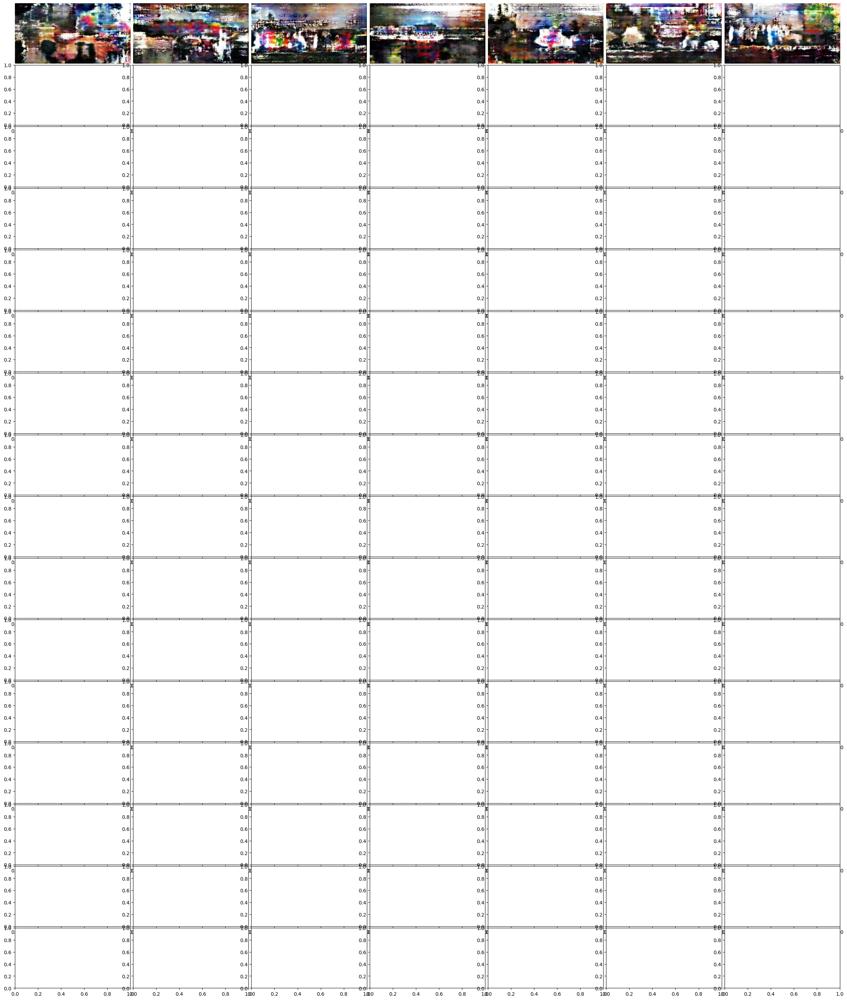

In [4]:
fig, axs = plt.subplots(len(image_dirs) * 2, num_samples // 2, figsize=(30, 36), gridspec_kw={'wspace': 0.025, 'hspace': 0.025})

# Iterate over each directory
for i, dir_path in enumerate(image_dirs):
    # Get a list of image file names in the directory
    image_files = sorted(os.listdir(dir_path))
    # Iterate over the selected random indices
    for j, idx in enumerate(sampled_indices):
        # Load and plot the image
        if j <= num_samples // 2:
            img_path = os.path.join(dir_path, image_files[idx])
            img = mpimg.imread(img_path)
            axs[i, j].imshow(img, aspect='auto')
            axs[i , j].axis('off')
        else:
            img_path = os.path.join(dir_path, image_files[idx])
            img = mpimg.imread(img_path)
            axs[i + 1, j-num_samples//2].imshow(img, aspect='auto')
            axs[i + 1, j-num_samples//2].axis('off')
    # Add a title above each pair of rows
    axs[i * 2, 0].annotate(names[i], (0, 0.5), (-0.05, 0.5), xycoords='axes fraction', va='center', ha='right', fontsize=28)

plt.tight_layout(pad=1)
plt.savefig('main_plot.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [5]:
from torch.utils.data import ConcatDataset

train_set = ProtestDataset(
                txt_file=os.path.join(config["root_dir"], "annot_train.txt"),
                img_dir=os.path.join(config["root_dir"], "img", "train"),
                multi_label = True,
                transform=None,
            )

test_set = ProtestDataset(
    txt_file=os.path.join(config["root_dir"], "annot_test.txt"),
    img_dir=os.path.join(config["root_dir"], "img", "test"),
    multi_label=True,
    transform=None,
)

# Combine the train and test sets
combined_dataset = ConcatDataset([train_set, test_set])

# Assuming sample['label'] is a numpy array containing the labels
binary_classification_labels = []
regression_labels = []

# Iterate over the dataset to extract label information
for sample in combined_dataset:
    binary_labels = sample['label'][[0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]]  # Binary classification labels
    regression_label = sample['label'][1]  # Regression label

    # Count occurrences of each label in the binary classification group
    binary_classification_labels.append(binary_labels)
    regression_labels.append(regression_label)

11
40764


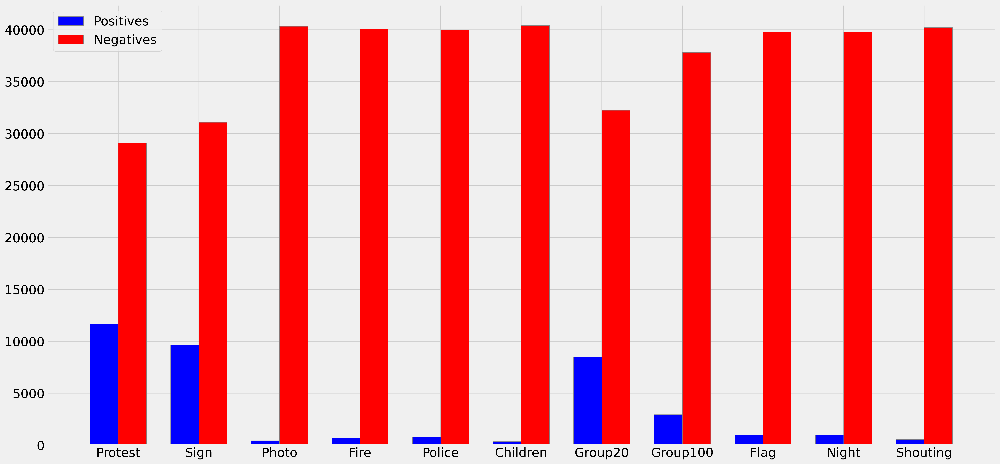

In [33]:
import numpy as np

binary_classification_labels = np.array(binary_classification_labels)
regression_labels = np.array(regression_labels)

plt.style.use('fivethirtyeight')

SMALL_SIZE = 20
MEDIUM_SIZE = 24
BIGGER_SIZE = 28

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title


num_labels = binary_classification_labels.shape[1]
size = binary_classification_labels.shape[0]
print(num_labels)
print(size)

# Calculate the counts of 1s and 0s for each label
ones_counts = np.sum(binary_classification_labels, axis=0)
zeros_counts = size - ones_counts

# Set the labels for the x-axis
labels = ['Protest','Sign','Photo','Fire','Police','Children','Group20','Group100','Flag','Night','Shouting']

# Set the width of the bars
bar_width = 0.35

# Set the position of the bars on the x-axis
r1 = np.arange(len(labels))
r2 = [x + bar_width for x in r1]

# Create the bar plot
plt.figure(figsize=(24, 12), dpi = 400)
plt.bar(r1, ones_counts, color='b', width=bar_width, edgecolor='grey', label='Positives')
plt.bar(r2, zeros_counts, color='r', width=bar_width, edgecolor='grey', label='Negatives')

# Add labels, title, and legend
#plt.xlabel('Labels', fontweight='bold')
#plt.ylabel('Counts', fontweight='bold')
plt.xticks([r + bar_width/2 for r in range(len(labels))], labels)
#plt.title('Counts of 1s and 0s for Binary Classification Labels')
plt.legend()

plt.savefig('class_dist.pdf',bbox_inches='tight', 
               transparent=True,
               pad_inches=0)

# Show plot
plt.show()

[0.         0.         0.         ... 0.46940152 0.44594978 0.        ]


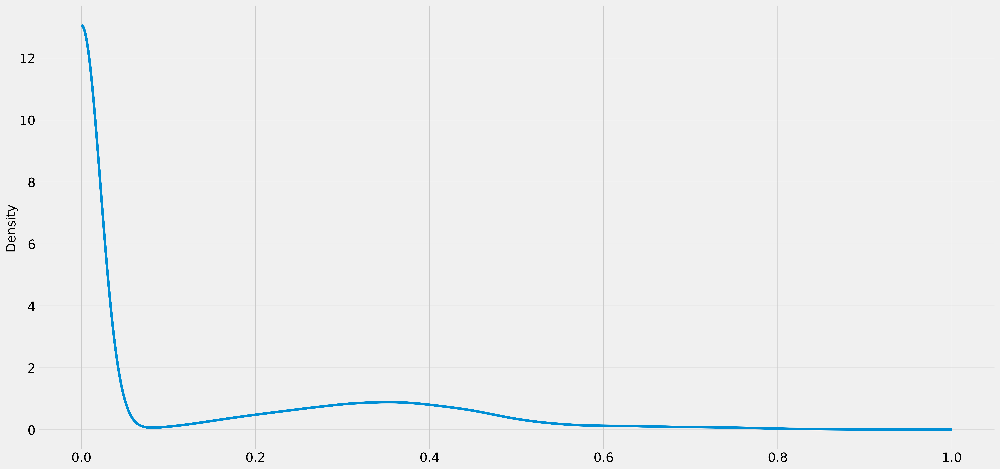

In [34]:
import seaborn as sns 
from scipy import stats
violence_regression_labels = regression_labels
density = stats.gaussian_kde(violence_regression_labels)
#sns.kdeplot(violence_regression_labels)
print(regression_labels)

plt.figure(figsize=(24, 12), dpi = 400)
x = np.arange(0., 1.00001, .002)
plt.plot(x, density(x), label='Negatives')
#plt.style.use('fivethirtyeight')
#plt.hist(violence_regression_labels, bins=2, color='skyblue', edgecolor='black')



plt.ylabel('Density',fontsize =20)
#plt.ylabel('Frequency')
#plt.title('Histogram of Violence Regression Labels')

plt.savefig('vio_dens.pdf',bbox_inches='tight', 
               transparent=True,
               pad_inches=0)

plt.show()